# Assignment 03

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
%matplotlib ipympl
%load_ext autoreload
%autoreload 2

## Q1: potential (irrotational) flow

Download the code in `2d-fluid-simulator.zip` and decompress in your working folder.  This simulator will allow you to make 2-D simulations analagous to flow in a wind tunnel or channel, and place obstacles in the channel and observe the flow around them. 

You will need to install `taichi` in a python environment.  I found `taichi` was a little finicky on my system, and had the best result making a new environment:

```
mamba create -n taichi
mamba activate taichi
mamba install python=3.11
pip install taichi
mamba install xarray netcdf4 pillow
```

### Q1.1a run

Run the simulation that has two obstacles at the bottom of a channel:

```
python main.py -bc 11 -re 4_000_000 -res 400 -dt 0.0002 -vc 0.0 \
   --save 1000 --cpu --savedir output2circRe4e6
```
This should display a plot on your screen that updates regularly.  There will also be netcdf files stored in a directory `output2circRe4e6`.  You can stop the simulation after it appears to come to a quasi-steady state (I did about 30k timesteps)

The first circle is centered at $(2/3, 0)$ with a radius of $1/6$.  The second circle is centered at $(8/7, 0)$ with a radius of $1/9$

Run a second time, but change the Reynolds number to 400 instead.

Note these simulations take a while to come to steady state because of the start-up transients in the forcing making waves that slosh back and forth.


### Q1.1b plot:

I could _not_ get taichi to play well with `dask` in xarray, so I analyze the data in a Phy426 environment (`mamba activate Phy426`) and I made sure that environment has dask installed (`mamba install dask`).  



Plot a snapshot near the end of these solutions, preferably at the same simulation time, and compare and contrast the different features.
  
_Hint_: `xr.open_mfdataset('2d-fluid-simulator/output2circRe4e6/output*.nc')` will "open" all the files you created in that subdirectory.  You can then index by time slice (`ds = ds.isel(time=20)`) to get one time slice to plot.  

_Hint_: I plotted the `u` velocity and used the `streamplot` function to plot approximations of the streamlines.

In [ ]:
# Code/plotting answer here (use more cells if desired)

For the higher Reynolds number case, the flow between the two obstacles is quite turbulent, with eddies shedding occasionally and moving downstream.  Far from the obstacles, the flow is relatively constant, though if you watch the animations, you can see instabilities develop along the top wall.

For the lower Reynolds number, thick boundary layers develop on both the top and bottom boundary.   There is a back eddy behind each of the obstacles, though there is little evidence of these shedding downstream.

*Text/markdown answer here.*  (use more cells if desired)

In [ ]:
# Code/plotting answer here (use more cells if desired)

*Text/markdown answer here.*  (use more cells if desired)

## Q1.3 numerical approximation to irrotational flow

Use a relaxation method to numerically solve Laplace's equation in the model domain (use the same model domain as the simulation).  Plot, and compare and contrast to both the simulation results and the analytical theory above.

In [ ]:
# Code/plotting answer here (use more cells if desired)

In [ ]:
# Code/plotting answer here (use more cells if desired)

*Text/markdown answer here.*  (use more cells if desired)

## Q2: Boundary layer growth

Finite viscosity leads to boundary layers. Make a new solution (this one only needs to run for 10_000 steps or so) using boundary condition 12.

```
python main.py -bc 12 -re 2_000 -res 400 -dt 0.0002 -vc 0.0 \
   --save 1000 --cpu --savedir outputjustwalls
```

This solution is simply flow in a channel with walls at the top and bottom boundaries.  

### Q2.1 plot the boundary layer

Focusing on the top face of the channel, make some images of the flow, and perhaps take an average of a few time steps for the low Reynolds number case (why average?), and describe.

In [ ]:
# Code/plotting answer here (use more cells if desired)

*Text/markdown answer here.*  (use more cells if desired)

### Q2.2 Check if upper boundary layer is "self similar"

Check if the numerics indicate that the upper boundary layer is "self-similar" by plotting the vertical profile of along-channel velocity and scaling the vertical axes appropriately by the distance along the channel $x$.  Focus your plots near the bottom of the channel - obviously the upper boundary is fixed in space and doesn't scale with the self similar scaling.

You will need a viscosity for this.  The model is run with L=1 m, and U=1 m/s, so the Reynold's number determines the viscosity. 

In [ ]:
# Code/plotting answer here (use more cells if desired)

*Text/markdown answer here.*  (use more cells if desired)

### Q2.3 Implement a shooting method to calculate the velocity in boundary layer

Using the shooting method to solve the Blasius solution as discussed in the text, and compare and contrast with the simulation above

In [ ]:
# Code/plotting answer here (use more cells if desired)

In [ ]:
# Code/plotting answer here (use more cells if desired)

*Text/markdown answer here.*  (use more cells if desired)

## Q3 Airfoils

### Q3.1 make an airfoil shape

`2d-fluid-simulator` allows a boundary condition that uses a shape (any shape!) defined by a black and white image.  

We define an image that makes an airfoil in the image below and save it with a long name.  If we copy that saved png into `2d-fluid-simulator/images/bc_mask/` as "airfoil.png", then we can run the simulation.

We will want some units for the data here.  $U=1\ \mathrm{m\,s^{-1}}$, and $dx = dy = 2 / 1600$ so that the wind tunnel is 2 m long and 1 m high, with $ny=800$ and $nx=1600$.

If we run at a Reynolds number of $Re=400,000$ then $nu = U L / Re$.  For this model $L = 1 m$, the width of the channel, so $\nu \approx 2.5\times10^{-6}\ \mathrm{m^2\,s^{-1}}$, or pretty close to molecular.  That doesn't mean that this simulation is very good - we would need much higher resolution to ensure that we resolved all the turbulence properly.

2d-fluid-simulator/images/bc_mask/airfoil_a0.15_offset-0.01250.025alpha0.00.png
alpha=0.0, beta=0.16744807921968935, lift/\rho U^2 = 0.31415926535897937


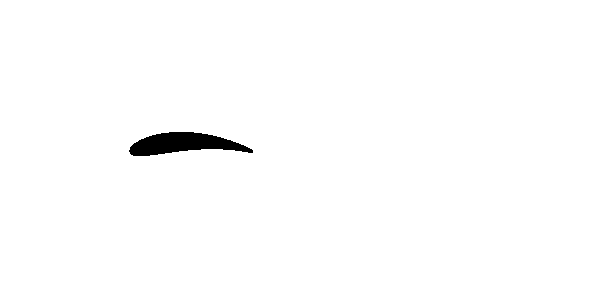

In [3]:
#x = np.arange(-1, 1, 0.00125)
#y = np.arange(-0.5, 0.5, 0.00125)

center = (-0.5, 0)

alpha = 0*np.pi/180

b = 0.13
a = 0.15
offset = -0.0125 + 1j*0.025

beta = np.arcsin(np.imag(offset)/a)



zetaCylinder = a*np.exp(1j*np.arange(0.,np.pi*2.,0.0001))+offset
Zfoil = zetaCylinder + b**2/zetaCylinder
Zfoil = Zfoil * np.exp(-1j*alpha)

fig, ax = plt.subplots(figsize=(6, 3))
#ax.set_position([0, 0, 1, 1])
ax.fill(np.real(Zfoil) + center[0], np.imag(Zfoil) + center[1], color='k', antialiased=False)
ax.set_aspect(1)
# ax.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xticks([])
ax.set_yticks([])

ax.set_xlim(-1, 1)
ax.set_ylim(-0.5, 0.5)

fig.savefig(f'2d-fluid-simulator/images/bc_mask/airfoil_a{a}_offset{np.real(offset)}{np.imag(offset)}alpha{alpha:1.2f}.png', dpi=300)
print(f'2d-fluid-simulator/images/bc_mask/airfoil_a{a}_offset{np.real(offset)}{np.imag(offset)}alpha{alpha:1.2f}.png')

print(f'alpha={alpha}, beta={beta}, lift/\\rho U^2 = {4*np.pi*a*np.sin(alpha+beta)}')


In [147]:
!cp 2d-fluid-simulator/images/bc_mask/airfoil_a0.15_offset-0.01250.025alpha0.00.png 2d-fluid-simulator/images/bc_mask/airfoil.png

## Q3.2: Run the simulation:

This simulation should ideally be run at higher resolution, thought it is possible your computer may not be up for it.  I also ran it for about 7000 s.  

`python main.py -bc 6 -re 400_000 -res 800 -dt 0.0002 -vc 0.0  --save 200 --cpu --savedir output_airfoil_00`

Create the airfoil for different attack angles by changing `alpha` in the code above. I did this for -15, -10, ... 15, 20 degrees.  Copy the airfoil shape and rerun the code above for about 7000 s, and be sure to change the name of the directory you are saving into (eg `output_airfoil_10` for 10 degrees of attack).  You should have 8 directories with simulation outputs in them.

## Q3.3 Plot the simulations

I plotted these all on one figure at `time=7000` - and I just plotted u.  Comment on the qualitative differences.

In [ ]:
# Code/plotting answer here (use more cells if desired)

*Text/markdown answer here.*  (use more cells if desired)

## Q3.4 Calculate the lift and circulation around the wing and plot versus angle of attack. 

For each run, calculate the lift on the wing, and the circulation around the wing.  

Note: for the lift, we want to integrate the pressure around the wing as it acts in the vertical. To do this you need to find the top and bottom of the wing in the matrix.  I did this with a for-loop initially.  Note that there are also some questionable pressure values right against the body, so I took the pressure value either one cell above or once cell below the wing for each value of x.  To figure this out, I suggest the code defined below.  Note that for the circulation, you need only choose a loop that is disjoint from the body, but given the lack of steadiness in the problem, it is a good idea to choose the loop a little ways from the wing.

Comment on agreement, or lack thereof with the expected lift, given $\alpha$ and $\sin \beta = \mathrm{imag(z_0)}/a$.  Also discuss how you think the drag changes as the attack angle changes (but don't calculate).



In [227]:
# get the lift and circulations:
def find_top_bottom(matrix):
    # Create a boolean mask where NaNs are True
    mask = np.isnan(matrix)

    # Get the top boundary by finding the first True in each column
    bottom = np.where(mask.any(axis=0), mask.argmax(axis=0), np.nan)

    # Get the bottom boundary by finding the last True in each column
    top = np.where(mask.any(axis=0), matrix.shape[0] - 1 - np.argmax(np.flip(mask, axis=0), axis=0), np.nan)
    top = top + 3
    bottom = bottom - 1
    return top, bottom


In [ ]:
# Code/plotting answer here (use more cells if desired)

In [ ]:
# Code/plotting answer here (use more cells if desired)

In [ ]:
# Code/plotting answer here (use more cells if desired)

*Text/markdown answer here.*  (use more cells if desired)